## Validation of the coadd procedure 

> Version: 1.0
> Container Size: Large

> Description: In this notebook, ...

In [1]:
import numpy as np
import VeraRubin as vr
import matplotlib.pyplot as plt

from lsst.daf.butler import Butler

In [2]:
# Initialize remote Butler
COLLECTION = "LSSTComCam/DP1"
REPOSITORY = "dp1"

butler = Butler(config=REPOSITORY, collections=COLLECTION)
assert butler is not None

In [3]:
# General CONFIGURATION
REMOTE_REPO = vr.get_butler_location(butler)  # Remote butler repo path
COLLECTION = "LSSTComCam/DP1"

LOCAL_REPO = "local_butler"

### Info LOCAL REPO

In [4]:
local_repo_path = LOCAL_REPO #os.path.join(os.getenv("HOME"), LOCAL_REPO) 
info_txt_path = os.path.join(local_repo_path, "custom_coadd_info.txt")

with open(info_txt_path, "r") as f:
        info = json.load(f)
info

{'repo_path': './local_butler',
 'collection': 'custom_coadd/20260303T072414Z',
 'coadd_type': 'deep_coadd_predetection',
 'tract': 5063,
 'patch': '34',
 'bands': ['u'],
 'instrument': 'LSSTComCam',
 'skymap': 'lsst_cells_v1'}

In [5]:
print("List of avalibles colections:")
# Collections
!butler query-collections --chains 'TREE' $LOCAL_REPO

List of avalibles colections:
                             Name                               Type 
------------------------------------------------------------- -------
LSSTComCam/runs/DRP/DP1/DM-51335                              RUN    
LSSTComCam/runs/DRP/DP1/DM-53601                              RUN    
LSSTComCam/runs/DRP/DP1/v29_0_0/DM-50260/20250416T185152Z     RUN    
custom_coadd/20260303T072414Z                                 RUN    
custom_coadd/inputs                                           TAGGED 
custom_coadd_without_stamp                                    CHAINED
  custom_coadd_without_stamp/20260303T080727Z                 RUN    
  custom_coadd_without_stamp/inputs                           TAGGED 
custom_coadd_without_stamp/20260303T080727Z                   RUN    
custom_coadd_without_stamp/inputs                             TAGGED 
direct_injected_run                                           RUN    
direct_warp_run                                             

### Loading

In [6]:
# Working with the local Butler
lbutler = Butler(LOCAL_REPO, collections='local_main_chain')  # original data
inj_lbutler = Butler(LOCAL_REPO, collections='local_with_injection')  # with injection
coadd_lbutler = Butler(LOCAL_REPO, collections='custom_coadd_without_stamp')  # coadd make without injection

In [7]:
# VISIT

In [8]:
# extracting the visitsID of the used visit_image
visitID = inj_lbutler.query_datasets("visit_image")

In [9]:
visitNumber = 5
visit_data = lbutler.get('visit_image', dataId=visitID[visitNumber].dataId)
visit_data_withInject = inj_lbutler.get('visit_image', dataId=visitID[visitNumber].dataId)

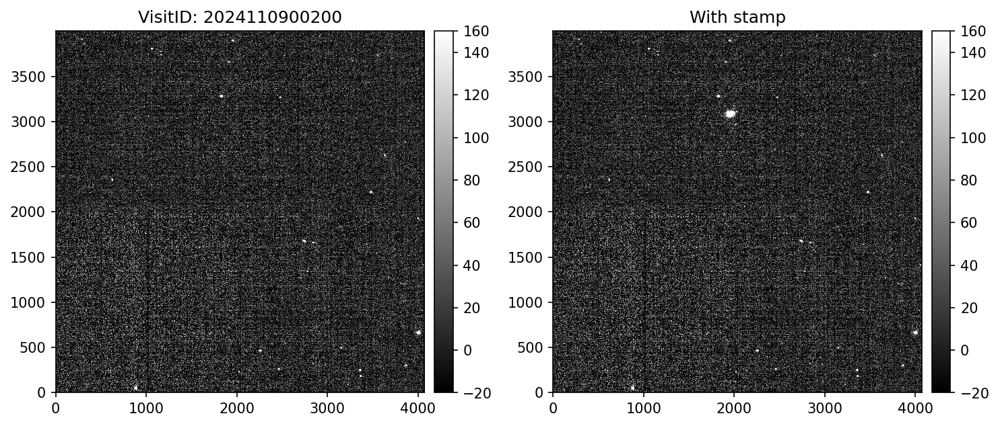

In [10]:
# Plot
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")

fig, ax = plt.subplots(1, 2, figsize=(10, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(visit_data.image)
ax[0].set_title(fr"VisitID: {visitID[visitNumber].dataId["visit"]:d}")

plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(visit_data_withInject.image)
ax[1].set_title(fr"With stamp")

plt.tight_layout()

In [11]:
# COADD

In [12]:
# Identify the coadd around location

band = 'u'
ra_deg, dec_deg = (53.2, -27.8)
loc_data = ra_deg, dec_deg

tract, patch = vr.tract_patch(inj_lbutler, ra_deg, dec_deg, sequential_index=True)
data_coadd = {'band': band, 'skymap': 'lsst_cells_v1', 'tract': tract, 'patch': patch}

In [13]:
coadd_original = lbutler.get('deep_coadd', dataId=data_coadd)
coadd_visit = coadd_lbutler.get('deep_coadd_predetection', dataId=data_coadd)
coadd_visit_withInject = inj_lbutler.get('deep_coadd_predetection', dataId=data_coadd)

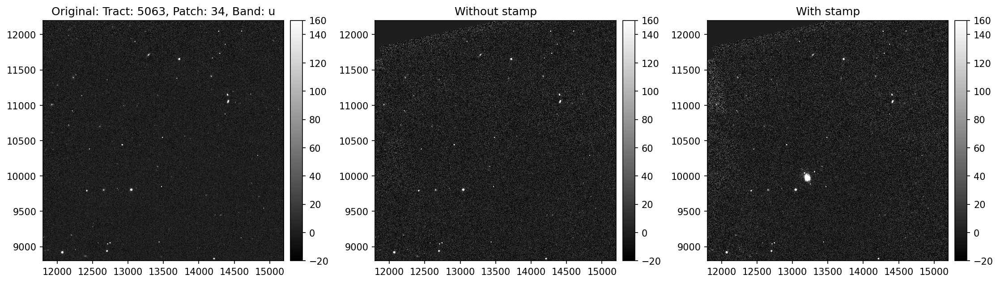

In [14]:
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")


fig, ax = plt.subplots(1, 3, figsize=(15, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_original.image)
ax[0].set_title(fr"Original: Tract: {tract}, Patch: {patch}, Band: {band}")


plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit.image)
ax[1].set_title(fr"Without stamp")

plt.sca(ax[2])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit_withInject.image)
ax[2].set_title(fr"With stamp")

plt.tight_layout()

## Comparing

In [15]:
import lsst.afw.table as afwTable
import lsst.daf.base as dafBase
import lsst.meas.algorithms as measAlgorithms

from lsst.meas.algorithms.detection import SourceDetectionTask
from lsst.meas.base import SingleFrameMeasurementTask
from lsst.meas.deblender import SourceDeblendTask
from lsst.ip.diffim import AlardLuptonSubtractTask

def warp_img(ref_img, img_to_warp, warping_kernel="lanczos5"):
    """

    Warp an exposure (image + PSF) onto the coordinate system of another.
    """
    import copy
    import lsst.afw.math as afwMath
    import lsst.afw.geom as afwGeom
    import lsst.meas.algorithms as measAlg

    # warp imagen
    config = afwMath.Warper.ConfigClass()
    config.warpingKernelName = warping_kernel
    warper = afwMath.Warper.fromConfig(config)

    bbox = ref_img.getBBox()
    warpedExp = warper.warpExposure(ref_img.wcs, img_to_warp, destBBox=bbox)
    warpedExp = copy.deepcopy(warpedExp)

    # PSF warp
    psf = img_to_warp.getPsf()
    if psf is not None:
        xyTransform = afwGeom.makeWcsPairTransform(img_to_warp.getWcs(),
                                                   ref_img.getWcs())
        warped_psf = measAlg.WarpedPsf(psf, xyTransform)
        warpedExp.setPsf(warped_psf)

    return warpedExp
    
def source_catalog(templateExposure, scienceExposure, warp=True):
    """
    The idea was take from:
    https://community.lsst.org/t/issues-with-image-subtraction/10429
    """
    import numpy as np
    import lsst.afw.table as afwTable
    import lsst.daf.base as dafBase
    from lsst.meas.algorithms.detection import SourceDetectionTask
    from lsst.meas.deblender import SourceDeblendTask
    from lsst.meas.base import SingleFrameMeasurementTask
    from lsst.ip.diffim import AlardLuptonSubtractTask, AlardLuptonSubtractConfig
    
    # Remove the bit mask
    print("===> Cleaning masks")
    template_masks = set(templateExposure.mask.getMaskPlaneDict())
    scienceExposure_masks = set(scienceExposure.mask.getMaskPlaneDict())
    common_masks = template_masks & scienceExposure_masks

    for exp in [templateExposure, scienceExposure]:
        for mask in list(exp.mask.getMaskPlaneDict().keys()):
            if mask not in common_masks:
               print(f"masks: {mask}")
               try:
                   exp.mask.removeAndClearMaskPlane(mask)
               except Exception:
                   pass
    
    # Make a schema
    # Identified sources on the scienceExposure. 
    # This catalog is used to select sources to perform 
    # the AL PSF matching on stamp images around them.
    schema = afwTable.SourceTable.makeMinimalSchema()
    schema.addField("coord_raErr", type="F")
    schema.addField("coord_decErr", type="F")
    schema.addField("detect_isPrimary", type="F")  # Flag
    schema.addField("sky_source", type="Flag")
    algMetadata = dafBase.PropertyList()

    # Detection task
    detectConfig = SourceDetectionTask.ConfigClass()
    detectConfig.thresholdValue = 5
    detectConfig.thresholdType = "stdev"
    detectTask = SourceDetectionTask(schema=schema, config=detectConfig)

    # here because schema is modify by detectTask.run
    deblendTask = SourceDeblendTask(schema=schema)
    measConfig = SingleFrameMeasurementTask.ConfigClass()
    measTask = SingleFrameMeasurementTask(schema=schema, config=measConfig, algMetadata=algMetadata)

    print("===> Run detection")
    tab = afwTable.SourceTable.make(schema)
    result = detectTask.run(tab, scienceExposure)
    sources = result.sources

    # Deblend + Measurement
    print("===> Run Deblend and Measurement")
    deblendTask.run(scienceExposure, sources)
    measTask.run(measCat=sources, exposure=scienceExposure)
    sources = sources.copy(True)

    # Sky sources flag (random)
    print("===> Sky sources")
    sky_source_key = schema["sky_source"].asKey()
    
    num_sources = len(sources)
    sky_indices = np.random.choice(num_sources, size=int(0.5 * num_sources), replace=False)
    for i, record in enumerate(sources):
        record.set(sky_source_key, i in sky_indices)

    # Warp the templateExposure to match with scienceExposure (imagen + PSF)
    if warp:
        print("===> Warping")
        warp_templateExposure = warp_img(
            ref_img=scienceExposure,
            img_to_warp=templateExposure)
    else:
        warp_templateExposure = templateExposure

    # Subtraction task 
    print("===> Subtracting")
    # https://pipelines.lsst.io/py-api/lsst.ip.diffim.AlardLuptonSubtractTask.html#lsst.ip.diffim.AlardLuptonSubtractTask.run
    config = AlardLuptonSubtractConfig()
    subtractTask = AlardLuptonSubtractTask(config=config)
    result = subtractTask.run(
        template=warp_templateExposure,
        science=scienceExposure,
        sources=sources
    )
    diff = result.difference

    return diff

### Custom Coadd vs Visit

In [16]:
# Directly subtraction
## Testing the coadd with the rotate/inject visits
ref_img = coadd_visit_withInject
img_to_warp = visit_data_withInject

rot_visit = warp_img(ref_img, img_to_warp, warping_kernel="lanczos5")

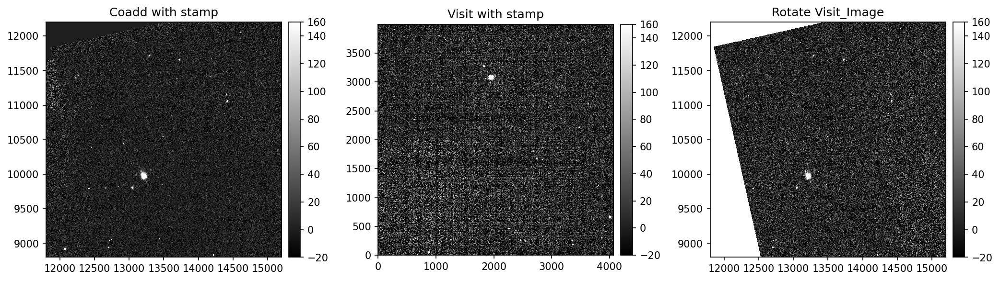

In [24]:
# Plot the result
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")

fig, ax = plt.subplots(1, 3, figsize=(14, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit_withInject.image)
ax[0].set_title(fr"Coadd with stamp")

plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(visit_data_withInject.image)
ax[1].set_title(fr"Visit with stamp")

plt.sca(ax[2])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(rot_visit.image)
ax[2].set_title(fr"Rotate Visit_Image")

plt.tight_layout()

[INFO] Converted LSST SkyWcs -> Astropy WCS


/home/arestrada88/Alma_proyect/VeraRubin/plot/exposure_plot.py:223: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


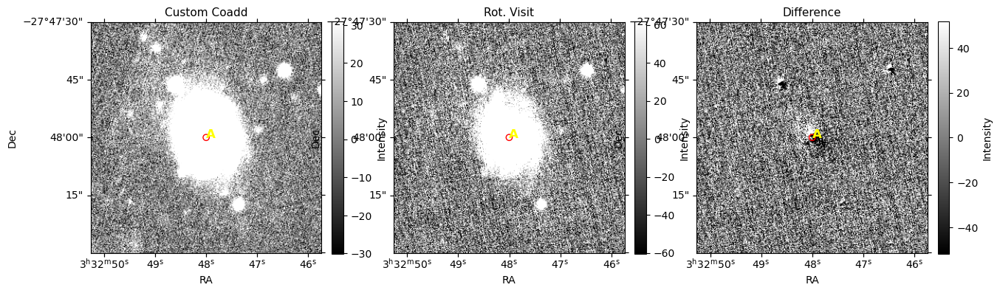

In [22]:
# Simple comparison (subtraction of both)
points = [loc_data]
before = coadd_visit_withInject
after = rot_visit

# necessary because the corner no is (0, 0)
bbox = after.getBBox()
xmin = bbox.getMinX()
xmax = bbox.getMaxX()
ymin = bbox.getMinY()
ymax = bbox.getMaxY()

vr.injection_steps(before,
                   after,
                   points,
                   diference=True,
                   cutout_radius_arcsec=30,  # arcsec  10
                   names=['Custom Coadd', 'Rot. Visit', 'Difference'],
                   grid=False, percentiles=[5, 95],
                   extent=[xmin, xmax, ymin, ymax])

In [ ]:
# Using Alard Lupton SubtractTask

In [23]:
diff_visit_Coadd = source_catalog(
    templateExposure=coadd_visit_withInject,
    scienceExposure=visit_data_withInject,
    warp=True)

===> Cleaning masks
===> Run detection


===> Run Deblend and Measurement


===> Sky sources
===> Warping
===> Subtracting


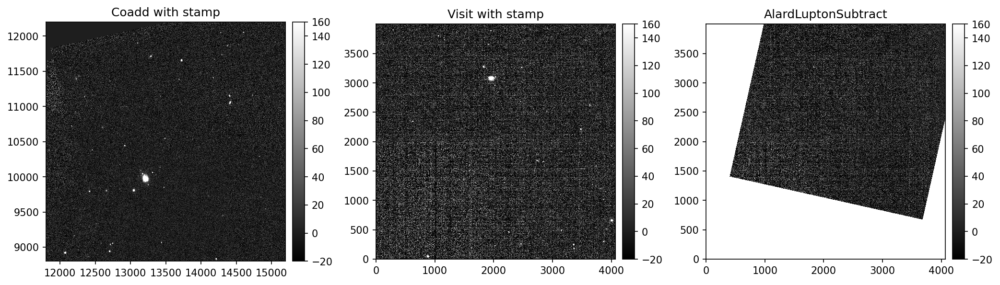

In [25]:
# Plot the result
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")

fig, ax = plt.subplots(1, 3, figsize=(14, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit_withInject.image)
ax[0].set_title(fr"Coadd with stamp")

plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(visit_data_withInject.image)
ax[1].set_title(fr"Visit with stamp")

plt.sca(ax[2])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(diff_visit_Coadd.image)
ax[2].set_title(fr"AlardLuptonSubtract")

plt.tight_layout()

[INFO] Converted LSST SkyWcs -> Astropy WCS


/home/arestrada88/Alma_proyect/VeraRubin/plot/exposure_plot.py:223: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


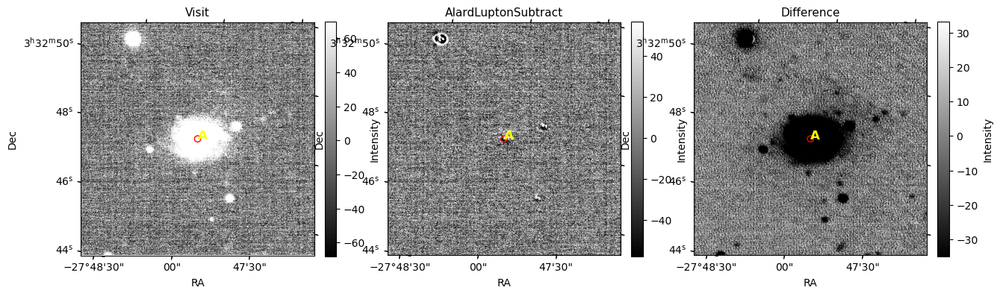

In [28]:
# Simple comparison (subtraction of both)
points = [loc_data]
before = visit_data_withInject
after = diff_visit_Coadd

# necessary because the corner no is (0, 0)
bbox = after.getBBox()
xmin = bbox.getMinX()
xmax = bbox.getMaxX()
ymin = bbox.getMinY()
ymax = bbox.getMaxY()

vr.injection_steps(before,
                   after,
                   points,
                   diference=True,
                   cutout_radius_arcsec=10,  # arcsec  10
                   names=['Visit', 'AlardLuptonSubtract', 'Difference'],
                   grid=False, percentiles=[5, 95],
                   extent=[xmin, xmax, ymin, ymax])

### Custom Coadd vs Custom Coadd without injection

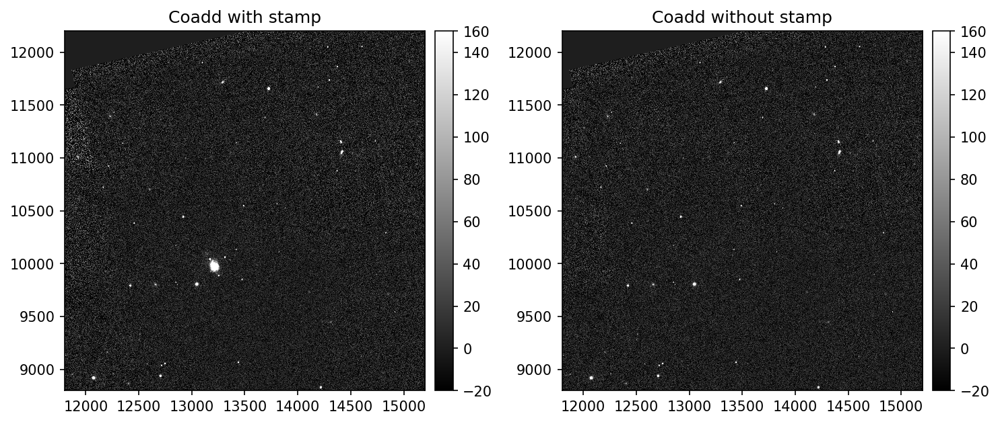

In [30]:
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")

fig, ax = plt.subplots(1, 2, figsize=(10, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
# display0.scale('linear', 'zscale')
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit_withInject.image)
ax[0].set_title(fr"Coadd with stamp")


plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
# display0.scale('linear', 'zscale')
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit.image)
ax[1].set_title(fr"Coadd without stamp")

plt.tight_layout()

[INFO] Converted LSST SkyWcs -> Astropy WCS


/home/arestrada88/Alma_proyect/VeraRubin/plot/exposure_plot.py:223: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


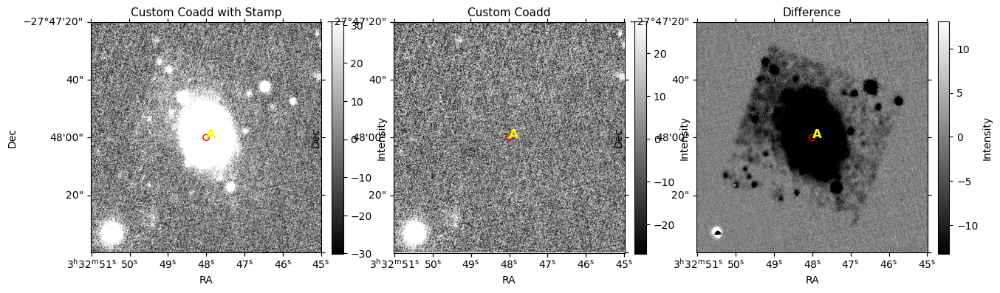

In [33]:
# Simple comparison (subtraction of both)
points = [loc_data]
before = coadd_visit_withInject
after = coadd_visit

# necessary because the corner no is (0, 0)
bbox = after.getBBox()
xmin = bbox.getMinX()
xmax = bbox.getMaxX()
ymin = bbox.getMinY()
ymax = bbox.getMaxY()

vr.injection_steps(before,
                   after,
                   points,
                   diference=True,
                   cutout_radius_arcsec=40,  # arcsec  10
                   names=['Custom Coadd with Stamp', 'Custom Coadd', 'Difference'],
                   grid=False, percentiles=[5, 95],
                   extent=[xmin, xmax, ymin, ymax])

In [34]:
diff_coadd_Coadd = source_catalog(
    templateExposure=coadd_visit_withInject,
    scienceExposure=coadd_visit,
    warp=False)

===> Cleaning masks
===> Run detection


===> Run Deblend and Measurement


===> Sky sources
===> Subtracting


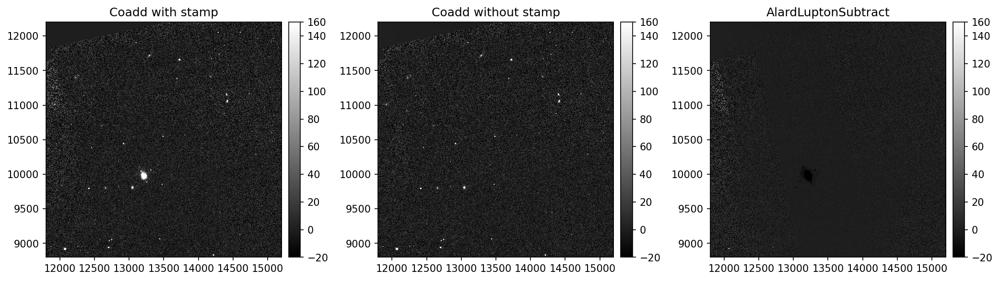

In [35]:
# Plot the result
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend("matplotlib")

fig, ax = plt.subplots(1, 3, figsize=(14, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit_withInject.image)
ax[0].set_title(fr"Coadd with stamp")

plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(coadd_visit.image)
ax[1].set_title(fr"Coadd without stamp")

plt.sca(ax[2])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', min=-20, max=150)
display0.mtv(diff_coadd_Coadd.image)
ax[2].set_title(fr"AlardLuptonSubtract")

plt.tight_layout()

#### Custom Coadd vs Coadd